# Top-30 storms by exceedance metrics: historical vs future

Analysis can be restricted to storms whose **first tracking point is north of
a given latitude**. The aim is to remove low-latitude systems (subtropical / 
tropical-origin storms) from the population so that the comparison focuses 
on genuinely extratropical cyclones in their mid- and high-latitude formation zone.

For each GCM-driven simulation pair (historical 1980-2014 vs future 2063-2097), we
isolate the most extreme extratropical cyclones and compare the two periods along
three axes of storm severity:

- **Occurrence** ($T_{ETC}$): number of grid-point-hours where the storm exceeds a
  given land-only reference percentile of precipitation or wind
- **Intensity** ($\overline{EE_V}$): mean excess above that percentile, averaged over
  all exceeding grid-point-hours
- **Cumulative excess** ($EE_{V,cum|ETC} = \overline{EE_V} \cdot T_{ETC}$): total amount
  by which the storm exceeds the reference, combining extent and intensity

Two percentiles are examined (99th, 99.9th) and two variables (precipitation, 10 m
wind speed). Each figure is a 2x3 grid: rows are percentiles, columns are GCM
pairs. Storms are selected two different ways — by cumulative excess (favouring
long-lived / widespread storms) and by regularized intensity (favouring the most
violent storms per grid-point-hour). The statistical summary table at the end
reports Mann-Whitney U and Kolmogorov-Smirnov tests for the *full* (filtered)
storm sample.

In [21]:
import pandas as pd
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import cartopy
import cartopy.crs as ccrs
from matplotlib.patches import Ellipse
from matplotlib.lines import Line2D
from scipy import stats

plt.rcParams.update({
    'font.family': 'serif',
    'font.size': 11,
    'axes.spines.top': False,
    'axes.spines.right': False,
    'axes.linewidth': 0.8,
    'axes.grid': False,
})

In [22]:
base = '/home/vdemeyer/projects/rrg-gachon/vdemeyer'
pairs = [('UBD', 'UBG'), ('UBE', 'UBH'), ('UBF', 'UBI')]
add_file = ''
future = False
if future:
    add_file_future = '_future_percentile'
else:
    add_file_future = ''
N_TOP = 30
PERCENTILES = [99, 999]  # '99' -> 99th, '999' -> 99.9th
PCT_LABEL = {99: '99th', 999: '99.9th'}

# Geographical filter: keep only storms whose first tracking point is north of LAT_MIN.
LAT_MIN = 0.0

sim_label = {
    'ERA5': r'ERA5',
    'UBB': r'CRCM6$_{\mathbf{ERA5}}$',
    'UBD': r'CRCM6$_{\mathbf{EC\text{-}Earth3\text{-}Veg}}$',
    'UBG': r'CRCM6$_{\mathbf{EC\text{-}Earth3\text{-}Veg}}$',
    'UBE': r'CRCM6$_{\mathbf{MPI\text{-}ESM1\text{-}2\text{-}HR}}$',
    'UBH': r'CRCM6$_{\mathbf{MPI\text{-}ESM1\text{-}2\text{-}HR}}$',
    'UBF': r'CRCM6$_{\mathbf{MIROC6}}$',
    'UBI': r'CRCM6$_{\mathbf{MIROC6}}$',
}

# Plain-text names (for tables)
sim_name = {
    'ERA5': 'ERA5',
    'UBB': 'CRCM6 (ERA5)',
    'UBD': 'CRCM6 (EC-Earth3-Veg)',
    'UBG': 'CRCM6 (EC-Earth3-Veg)',
    'UBE': 'CRCM6 (MPI-ESM1-2-HR)',
    'UBH': 'CRCM6 (MPI-ESM1-2-HR)',
    'UBF': 'CRCM6 (MIROC6)',
    'UBI': 'CRCM6 (MIROC6)',
}

C_HIST = '#2166ac'   # dark blue
C_FUT  = '#b2182b'   # dark red
C_HIST_LIGHT = '#92c5de'
C_FUT_LIGHT  = '#f4a582'

# Season -> marker (used by scatter plots) and -> color (used by trajectory plots)
SEASON_MARKER = {'DJF': 'o', 'MAM': 's', 'JJA': '^', 'SON': 'D'}
SEASON_LABEL = {'DJF': 'DJF', 'MAM': 'MAM', 'JJA': 'JJA', 'SON': 'SON'}
# Distinct from the HIST/FUT line colors so the season-coded first-point dot reads
# clearly on top of the trajectories. DJF=violet, MAM=green, JJA=gold, SON=orange.
SEASON_COLOR = {'DJF': '#7c4fa0', 'MAM': '#2ca02c', 'JJA': '#ffd92f', 'SON': '#c97f23'}


def month_to_season(m):
    if m in (12, 1, 2): return 'DJF'
    if m in (3, 4, 5): return 'MAM'
    if m in (6, 7, 8): return 'JJA'
    return 'SON'


tracks_cache = {}  # sim -> full track DataFrame, populated on first access


def load_tracks(sim):
    """Read (and cache) the full tracking file for one simulation.

    Columns: storm, point, i, j, date (str), lat, lon, pressure. Used both by the
    first-point-latitude filter and by the trajectory plots."""
    if sim not in tracks_cache:
        track_file = f'{base}/TRACKING/KATJA/OUTPUTS/{sim}_psl_smooth_400km_12h_1000hPa.txt'
        tracks_cache[sim] = pd.read_csv(track_file, sep=r' ', header=0, engine='python',
                                          names=['storm', 'point', 'i', 'j', 'date', 'lat', 'lon', 'pressure'])
    return tracks_cache[sim]


def first_point_lat(sim):
    """Return a Series indexed by storm id with the latitude of the first tracking point."""
    df_t = load_tracks(sim)
    return df_t.sort_values(['storm', 'point']).groupby('storm')['lat'].first()


# Load both 99th and 99.9th percentile data. When LAT_MIN > 0, also restrict to
# storms whose first tracking point is north of LAT_MIN; for that case we need to
# read the track files to compute the initiation latitude.
# When LAT_MIN <= 0 (default), we skip the track-file read entirely — no filter
# is applied and the trajectory plots load the tracks lazily on their own.
data_pct = {pct: {} for pct in PERCENTILES}
first_lat_cache = {}  # sim -> Series, populated only if LAT_MIN > 0

apply_lat_filter = LAT_MIN > 0

for pct in PERCENTILES:
    for hist, fut in pairs:
        for sim, period in ((hist, '1980-2014'), (fut, '2063-2097')):
            suffix = add_file if period == '1980-2014' else add_file_future
            pkl = f'{base}/TRACKING/KATJA/OUTPUTS/{sim}/STORM_METRICS/storm_exceed_{pct}_metrics_landonly_{sim}_{period}{suffix}.pkl'
            df = pd.read_pickle(pkl)
            df['season'] = df['initiation_date'].dt.month.map(month_to_season)
            n_before = len(df)

            if apply_lat_filter:
                if sim not in first_lat_cache:
                    first_lat_cache[sim] = first_point_lat(sim)
                init_lat = df['storm_id'].map(first_lat_cache[sim])
                mask = init_lat > LAT_MIN
                df = df[mask].copy()
                df['init_lat'] = init_lat[mask].values
                print(f"[{PCT_LABEL[pct]}] {sim}: {len(df)}/{n_before} storms kept "
                      f"(first-point lat > {LAT_MIN}°N)")
            else:
                print(f"[{PCT_LABEL[pct]}] {sim}: {n_before} storms (no latitude filter)")

            data_pct[pct][sim] = df

# Default dict used by the summary-statistics table (99.9th percentile)
data = data_pct[999]


def confidence_ellipse(x, y, ax, n_std=1.645, **kwargs):
    """Draw a covariance-based confidence ellipse (default 90%)."""
    if len(x) < 3:
        return
    cov = np.cov(x, y)
    eigvals, eigvecs = np.linalg.eigh(cov)
    order = eigvals.argsort()[::-1]
    eigvals, eigvecs = eigvals[order], eigvecs[:, order]
    angle = np.degrees(np.arctan2(*eigvecs[:, 0][::-1]))
    width, height = 2 * n_std * np.sqrt(eigvals)
    ellipse = Ellipse(xy=(np.mean(x), np.mean(y)), width=width, height=height,
                       angle=angle, **kwargs)
    ax.add_patch(ellipse)


def format_pval(p):
    if p < 0.001:  return "p < 0.001"
    elif p < 0.01: return f"p = {p:.3f}"
    elif p < 0.05: return f"p = {p:.3f}"
    else:           return f"p = {p:.2f}"


def significance_stars(p):
    if p < 0.001: return '***'
    elif p < 0.01: return '**'
    elif p < 0.05: return '*'
    else: return 'n.s.'

[99th] UBD: 10608 storms (no latitude filter)
[99th] UBG: 9730 storms (no latitude filter)
[99th] UBE: 10280 storms (no latitude filter)
[99th] UBH: 10005 storms (no latitude filter)
[99th] UBF: 11552 storms (no latitude filter)
[99th] UBI: 11010 storms (no latitude filter)
[99.9th] UBD: 10608 storms (no latitude filter)
[99.9th] UBG: 9730 storms (no latitude filter)
[99.9th] UBE: 10280 storms (no latitude filter)
[99.9th] UBH: 10005 storms (no latitude filter)
[99.9th] UBF: 11552 storms (no latitude filter)
[99.9th] UBI: 11010 storms (no latitude filter)


## Selection by cumulative excess

The first set of figures selects, in each panel, the **top-N storms by cumulative
excess** $EE_{V,cum|ETC}$. This favours storms that are both intense *and*
spatially/temporally extended. For each panel we plot raw occurrence $T_{ETC}$
against raw mean excess intensity $\overline{EE_V}$; dashed ellipses show the 90%
covariance-based confidence region. Marker shape encodes initiation season.

A Mann-Whitney U test (two-sided) is reported for each of the three metrics
within each panel; significance is shown next to the legend.

### Precipitation

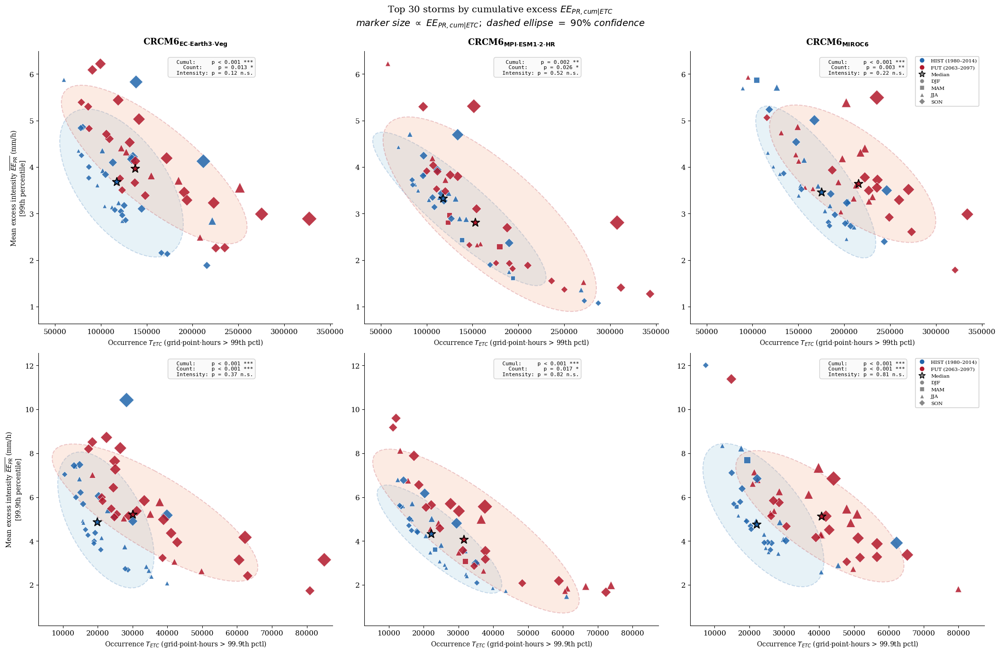

In [23]:
LAMBDA = 10000  # default regularization for intensity-based selection: I_reg = mean_excess * n / (n + LAMBDA)

def add_regularized_intensity(df, metric_var, lam):
    """Return a copy of df with an ireg_{var}_lam{lam} column."""
    cnt = df[f'count_exceed_{metric_var}'].astype(float).values
    inten = df[f'mean_excess_{metric_var}'].astype(float).values
    out = df.copy()
    out[f'ireg_{metric_var}_lam{lam}'] = inten * (cnt / (cnt + lam))
    return out


def _ellipse_bbox(x, y, n_std=1.645):
    """Bounding box (xmin, xmax, ymin, ymax) of the rotated 90% confidence ellipse."""
    if len(x) < 3:
        return (np.nan, np.nan, np.nan, np.nan)
    cov = np.cov(x, y)
    eigvals, eigvecs = np.linalg.eigh(cov)
    order = eigvals.argsort()[::-1]
    eigvals, eigvecs = eigvals[order], eigvecs[:, order]
    angle = np.arctan2(*eigvecs[:, 0][::-1])
    w, h = 2 * n_std * np.sqrt(eigvals)
    mx, my = np.mean(x), np.mean(y)
    ex = 0.5 * np.sqrt((w * np.cos(angle)) ** 2 + (h * np.sin(angle)) ** 2)
    ey = 0.5 * np.sqrt((w * np.sin(angle)) ** 2 + (h * np.cos(angle)) ** 2)
    return (mx - ex, mx + ex, my - ey, my + ey)


def plot_top_scatter(metric_var, units, select_by='cum', variable_marker_size=True,
                      lambda_=LAMBDA, top_storms=N_TOP):
    """Scatter (count, intensity) for top-N storms, 2 rows (99th, 99.9th) x 3 cols (pairs).

    Parameters
    ----------
    metric_var : {'pr', 'wind'}
    units : str
        Units of mean excess intensity (e.g. 'mm/h' or 'm/s'), shown in axis labels.
    select_by : {'cum', 'intensity'}
        'cum'       -> top-N by cumulative excess EE_{V,cum|ETC}
        'intensity' -> top-N by regularized intensity I_reg = mean_excess * n / (n + lam)
        Axes always display raw count and raw mean_excess.
    variable_marker_size : bool
        If True, marker area scales with cumulative excess EE_{V,cum|ETC}.
    lambda_ : float
        Regularization strength for I_reg (only used when select_by='intensity').
    top_storms : int
        Number of storms kept per (simulation, percentile) panel.

    Within each row (one percentile), all three panel columns share the same x- and y-limits
    so the three GCM pairs can be compared at a glance. Limits include the full 90% ellipse,
    which means x can go slightly negative.

    The legend is drawn only in the right-most column of each row (one legend per percentile)
    to avoid repeating it six times across the figure.
    """
    cum_col = f'cum_excess_{metric_var}'
    cnt_col = f'count_exceed_{metric_var}'
    int_col = f'mean_excess_{metric_var}'
    ireg_col = f'ireg_{metric_var}_lam{lambda_}'
    var_math = 'PR' if metric_var == 'pr' else 'WS'

    # First pass: compute per-panel selection and the row-level shared limits
    selections = {}                       # (row, col) -> (df_hist_top, df_fut_top)
    row_x = {r: [np.inf, -np.inf] for r in range(len(PERCENTILES))}
    row_y = {r: [np.inf, -np.inf] for r in range(len(PERCENTILES))}

    for row, pct in enumerate(PERCENTILES):
        for col, (hist, fut) in enumerate(pairs):
            df_h_all = data_pct[pct][hist]
            df_f_all = data_pct[pct][fut]
            if select_by == 'intensity':
                df_h_all = add_regularized_intensity(df_h_all, metric_var, lambda_)
                df_f_all = add_regularized_intensity(df_f_all, metric_var, lambda_)
                sel_col = ireg_col
            else:
                sel_col = cum_col
            df_hist = df_h_all.nlargest(top_storms, sel_col)
            df_fut = df_f_all.nlargest(top_storms, sel_col)
            selections[(row, col)] = (df_hist, df_fut)

            xh = df_hist[cnt_col].values.astype(float)
            yh = df_hist[int_col].values.astype(float)
            xf = df_fut[cnt_col].values.astype(float)
            yf = df_fut[int_col].values.astype(float)

            xs = np.concatenate([xh, xf])
            ys = np.concatenate([yh, yf])
            row_x[row][0] = min(row_x[row][0], np.nanmin(xs))
            row_x[row][1] = max(row_x[row][1], np.nanmax(xs))
            row_y[row][0] = min(row_y[row][0], np.nanmin(ys))
            row_y[row][1] = max(row_y[row][1], np.nanmax(ys))

            # Extend by the bounding boxes of the two 90% ellipses so nothing gets clipped
            for xx, yy in ((xh, yh), (xf, yf)):
                emin_x, emax_x, emin_y, emax_y = _ellipse_bbox(xx, yy)
                if np.isfinite(emin_x):
                    row_x[row][0] = min(row_x[row][0], emin_x)
                    row_x[row][1] = max(row_x[row][1], emax_x)
                    row_y[row][0] = min(row_y[row][0], emin_y)
                    row_y[row][1] = max(row_y[row][1], emax_y)

    fig, axes = plt.subplots(2, 3, figsize=(21, 13), constrained_layout=True)

    for row, pct in enumerate(PERCENTILES):
        x_pad = 0.03 * (row_x[row][1] - row_x[row][0])
        y_pad = 0.05 * (row_y[row][1] - row_y[row][0])

        for col, (hist, fut) in enumerate(pairs):
            ax = axes[row, col]
            df_hist, df_fut = selections[(row, col)]

            xh, yh = df_hist[cnt_col].values.astype(float), df_hist[int_col].values
            xf, yf = df_fut[cnt_col].values.astype(float), df_fut[int_col].values

            confidence_ellipse(xh, yh, ax, n_std=1.645, facecolor=C_HIST_LIGHT, alpha=0.22,
                               edgecolor=C_HIST, linewidth=1.4, linestyle='--')
            confidence_ellipse(xf, yf, ax, n_std=1.645, facecolor=C_FUT_LIGHT, alpha=0.22,
                               edgecolor=C_FUT, linewidth=1.4, linestyle='--')

            cum_h = df_hist[cum_col].values
            cum_f = df_fut[cum_col].values
            if variable_marker_size:
                cum_all = np.concatenate([cum_h, cum_f])
                cmin, cmax = cum_all.min(), cum_all.max()
                size_of = lambda c: 40 + 220 * (c - cmin) / (cmax - cmin + 1e-9)
            else:
                size_of = lambda c: np.full_like(c, 85, dtype=float)

            for season, marker in SEASON_MARKER.items():
                mh = df_hist['season'].values == season
                mf = df_fut['season'].values == season
                if mh.any():
                    ax.scatter(xh[mh], yh[mh], s=size_of(cum_h[mh]), color=C_HIST,
                               marker=marker, edgecolors='white', linewidths=0.6,
                               alpha=0.85, zorder=3)
                if mf.any():
                    ax.scatter(xf[mf], yf[mf], s=size_of(cum_f[mf]), color=C_FUT,
                               marker=marker, edgecolors='white', linewidths=0.6,
                               alpha=0.85, zorder=3)

            ax.scatter(np.median(xh), np.median(yh), s=180, color=C_HIST,
                       edgecolors='k', linewidths=1.4, marker='*', zorder=6)
            ax.scatter(np.median(xf), np.median(yf), s=180, color=C_FUT,
                       edgecolors='k', linewidths=1.4, marker='*', zorder=6)

            _, p_cum = stats.mannwhitneyu(df_hist[cum_col], df_fut[cum_col], alternative='two-sided')
            _, p_cnt = stats.mannwhitneyu(df_hist[cnt_col], df_fut[cnt_col], alternative='two-sided')
            _, p_int = stats.mannwhitneyu(df_hist[int_col], df_fut[int_col], alternative='two-sided')

            # Legend only in the right-most column (one per row / percentile)
            if col == len(pairs) - 1:
                legend_handles = [
                    Line2D([0], [0], marker='o', color='w', markerfacecolor=C_HIST,
                           markeredgecolor='white', markersize=8, label='HIST (1980\u20132014)'),
                    Line2D([0], [0], marker='o', color='w', markerfacecolor=C_FUT,
                           markeredgecolor='white', markersize=8, label='FUT (2063\u20132097)'),
                    Line2D([0], [0], marker='*', color='w', markerfacecolor='#888',
                           markeredgecolor='k', markersize=10, label='Median'),
                ]
                for season, marker in SEASON_MARKER.items():
                    legend_handles.append(
                        Line2D([0], [0], marker=marker, color='w', markerfacecolor='#888',
                               markeredgecolor='white', markersize=7, label=season)
                    )
                leg = ax.legend(handles=legend_handles, fontsize=7.5, loc='upper right',
                                framealpha=0.9, edgecolor='#cccccc', ncol=1,
                                bbox_to_anchor=(0.99, 0.99))
                ax.add_artist(leg)

            textstr = (f'  Cumul:     {format_pval(p_cum)} {significance_stars(p_cum)}\n'
                       f'  Count:     {format_pval(p_cnt)} {significance_stars(p_cnt)}\n'
                       f'  Intensity: {format_pval(p_int)} {significance_stars(p_int)}')
            ax.text(0.73, 0.97, textstr, transform=ax.transAxes, fontsize=8,
                    verticalalignment='top', horizontalalignment='right',
                    fontfamily='monospace',
                    bbox=dict(boxstyle='round,pad=0.4', facecolor='#fafafa',
                              edgecolor='#cccccc', alpha=0.9))

            ax.set_xlabel(rf'Occurrence $T_{{ETC}}$ (grid-point-hours > {PCT_LABEL[pct]} pctl)', fontsize=10)
            if col == 0:
                ax.set_ylabel(rf'Mean excess intensity $\overline{{EE_{{{var_math}}}}}$ ({units})' + '\n'
                              f'[{PCT_LABEL[pct]} percentile]', fontsize=10)
            if row == 0:
                ax.set_title(sim_label[hist], fontsize=13, fontweight='bold', pad=10)

            # Shared limits per row, with ellipse-aware padding (x may be slightly negative)
            ax.set_xlim(row_x[row][0] - x_pad, row_x[row][1] + x_pad)
            ax.set_ylim(row_y[row][0] - y_pad, row_y[row][1] + y_pad)

    var_text = 'precipitation' if metric_var == 'pr' else 'wind'
    size_text = (rf'$\it{{marker\ size\ \propto\ EE_{{{var_math},cum|ETC}};\ dashed\ ellipse\ =\ 90\%\ confidence}}$'
                 if variable_marker_size
                 else r'$\it{dashed\ ellipse\ =\ 90\%\ confidence}$')
    if select_by == 'cum':
        sel_title = rf'Top {top_storms} storms by cumulative excess $EE_{{{var_math},cum|ETC}}$'
    else:
        sel_title = (rf'Top {top_storms} storms by regularized intensity '
                     rf'$\overline{{EE_{{{var_math}}}}} \cdot T_{{ETC}}/(T_{{ETC}}+\lambda)$  '
                     rf'($\lambda = {lambda_}$)')
    fig.suptitle(sel_title + '\n' + size_text, fontsize=14, y=1.05)
    return fig


fig = plot_top_scatter('pr', 'mm/h', select_by='cum', variable_marker_size=True)
plt.show()
# fig.savefig(f'{base}/TRACKING/KATJA/PLOT/scatter_top{N_TOP}_storms_cumul_precip_land.png', dpi=200, bbox_inches='tight')

In [24]:
def plot_top_trajectories(metric_var, units, select_by='cum',
                            lambda_=LAMBDA, top_storms=N_TOP):
    """Map the trajectories of the same top-N storms shown in the scatter above.

    2 rows (99th, 99.9th percentile) x 3 cols (GCM pairs). In each panel:
      - HIST top-N tracks drawn in C_HIST (blue), FUT in C_FUT (red), with a
        thick translucent line and no per-point markers.
      - The first tracking point is marked with a filled circle whose color
        encodes the initiation season (SEASON_COLOR).
    Selection (`select_by`, `lambda_`) and `top_storms` follow the same convention
    as plot_top_scatter, so the trajectories shown here correspond exactly to the
    storms in the scatter panel directly above.

    Base-map style (Lambert Conformal, NE1 background, lakes, borders, gridlines)
    follows the project's standard cartopy template.
    """
    plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)
    fig, axes = plt.subplots(2, 3, subplot_kw={'projection': plotcrs},
                              figsize=(13.5, 10), constrained_layout=True,
                              gridspec_kw={'hspace': 0.0, 'wspace': 0.0})
    # Tighten the constrained-layout pads so panels and suptitle sit close together.
    try:
        fig.get_layout_engine().set(h_pad=0.14, w_pad=0.0, hspace=0.0, wspace=0.0)
    except Exception:
        pass

    # Map assets are constructed once and reused across panels
    borders = cartopy.feature.NaturalEarthFeature(
        category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
    states_provinces = cartopy.feature.NaturalEarthFeature(
        category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
    lakes = cartopy.feature.NaturalEarthFeature(
        category='physical', name='lakes', scale='50m', facecolor='#72a2c7')
    img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')

    for row, pct in enumerate(PERCENTILES):
        for col, (hist, fut) in enumerate(pairs):
            ax = axes[row, col]
            ax.set_extent([-128, -56, 81, 12], crs=ccrs.PlateCarree())
            ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90),
                      transform=ccrs.PlateCarree())
            ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
            ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
            ax.add_feature(lakes, zorder=1, linewidth=0.2, edgecolor='black')
            ax.coastlines(resolution='10m', linewidth=0.4, color='black')
            ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25,
                         xlocs=range(-180, 180, 10), ylocs=range(-90, 90, 10))

            n_drawn = {hist: 0, fut: 0}
            for sim, line_color in ((hist, C_HIST), (fut, C_FUT)):
                df = data_pct[pct][sim]
                if select_by == 'intensity':
                    df = add_regularized_intensity(df, metric_var, lambda_)
                    sel_col = f'ireg_{metric_var}_lam{lambda_}'
                else:
                    sel_col = f'cum_excess_{metric_var}'
                top = df.nlargest(top_storms, sel_col)
                top_ids = top['storm_id'].tolist()
                season_by_id = dict(zip(top['storm_id'], top['season']))

                tracks = load_tracks(sim)
                tr = tracks[tracks['storm'].isin(top_ids)].sort_values(['storm', 'point'])
                for sid, g in tr.groupby('storm'):
                    ax.plot(g['lon'].values, g['lat'].values,
                             color=line_color, lw=2, alpha=0.75,
                             solid_capstyle='round', solid_joinstyle='round',
                             transform=ccrs.Geodetic(), zorder=3)
                    season = season_by_id.get(sid)
                    ax.scatter(g['lon'].iloc[0], g['lat'].iloc[0],
                                color=SEASON_COLOR.get(season, '#888888'),
                                s=45, edgecolors='black', linewidths=0.7,
                                transform=ccrs.PlateCarree(), zorder=5)
                    n_drawn[sim] += 1

            if row == 0:
                ax.set_title(sim_label[hist], fontsize=12, fontweight='bold', pad=4)
            if col == 0:
                ax.text(-0.03, 0.5, f'[{PCT_LABEL[pct]} percentile]',
                         fontsize=11, fontweight='bold',
                         transform=ax.transAxes, rotation=90, va='center', ha='right')

    # Single horizontal legend below row 2 (outside the panels)
    handles = [
        Line2D([0], [0], color=C_HIST, linewidth=3, alpha=0.7,
                label=f'HIST top {top_storms}'),
        Line2D([0], [0], color=C_FUT, linewidth=3, alpha=0.7,
                label=f'FUT top {top_storms}'),
    ]
    for season in ('DJF', 'MAM', 'JJA', 'SON'):
        handles.append(Line2D([0], [0], marker='o', color='w',
                                markerfacecolor=SEASON_COLOR[season],
                                markeredgecolor='black', markeredgewidth=0.6,
                                markersize=8, label=f'Init {season}'))
    fig.legend(handles=handles, loc='outside lower center', ncol=6,
                fontsize=10, frameon=False)

    var_text = 'precipitation' if metric_var == 'pr' else 'wind'
    var_math = 'PR' if metric_var == 'pr' else 'WS'
    if select_by == 'cum':
        sel_title = rf'Top {top_storms} storms by cumulative excess $EE_{{{var_math},cum|ETC}}$'
    else:
        sel_title = (rf'Top {top_storms} storms by regularized intensity '
                     rf'$\overline{{EE_{{{var_math}}}}} \cdot T_{{ETC}}/(T_{{ETC}}+\lambda)$  '
                     rf'($\lambda = {lambda_}$)')
    fig.suptitle(f'Trajectories — {var_text}\n' + sel_title, fontsize=14)
    return fig


fig = plot_top_trajectories('pr', 'mm/h', select_by='cum')
plt.show()
# fig.savefig(f'{base}/TRACKING/PLOT/tracks_top{N_TOP}_storms_cumul_precip.png', dpi=200, bbox_inches='tight')


KeyboardInterrupt



Error in callback <function _draw_all_if_interactive at 0x151fe82f7c40> (for post_execute), with arguments args (),kwargs {}:



KeyboardInterrupt



Error in callback <function flush_figures at 0x151fdc84fba0> (for post_execute), with arguments args (),kwargs {}:


Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x1520090608d0>>
Traceback (most recent call last):
  File "/home/vdemeyer/py3/lib/python3.11/site-packages/ipykernel/ipkernel.py", line 775, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(

KeyboardInterrupt: 


KeyboardInterrupt: 

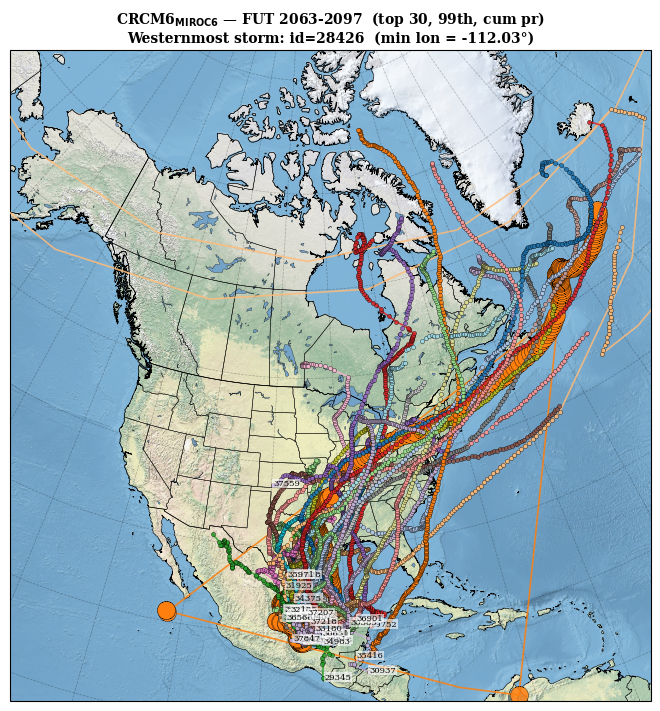


Westernmost storm id (MIROC6 FUT, p99 pr cum, top 30): 28426
Track points (591 rows):


,storm,point,i,j,date,lat,lon,pressure
0,28426,1,305,58,2067-08-14 18:00:00,19.14,-95.51,1003.970
1,28426,2,304,57,2067-08-14 19:00:00,19.03,-95.62,1003.520
2,28426,3,304,57,2067-08-14 20:00:00,19.03,-95.62,1002.830
3,28426,4,303,58,2067-08-14 21:00:00,19.14,-95.72,1002.440
4,28426,5,303,58,2067-08-14 22:00:00,19.14,-95.72,1002.340
...,...,...,...,...,...,...,...,...
586,28426,587,597,526,2067-09-08 04:00:00,56.04,-30.98,999.023
587,28426,588,597,528,2067-09-08 05:00:00,56.19,-30.70,999.104
588,28426,589,598,530,2067-09-08 06:00:00,56.26,-30.28,999.140
589,28426,590,597,533,2067-09-08 07:00:00,56.56,-29.96,999.267


In [28]:
# --- Diagnostic cell ---
# MIROC6 FUT (UBI), p99 cumulative precipitation: plot the 30 selected storms
# with one color per storm and explicit point markers, then identify the
# westernmost storm (smallest min(lon) over its track) and print its full
# trajectory as a table for manual inspection.

def plot_miroc6_fut_diagnostic(metric_var='pr', select_by='cum', pct=99,
                                 lambda_=LAMBDA, top_storms=N_TOP):
    sim = 'UBI'  # MIROC6 FUT
    plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)
    fig, ax = plt.subplots(1, 1, subplot_kw={'projection': plotcrs},
                            figsize=(9, 7), constrained_layout=True)

    borders = cartopy.feature.NaturalEarthFeature(
        category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
    states_provinces = cartopy.feature.NaturalEarthFeature(
        category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
    lakes = cartopy.feature.NaturalEarthFeature(
        category='physical', name='lakes', scale='50m', facecolor='#72a2c7')
    img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')

    ax.set_extent([-128, -56, 81, 12], crs=ccrs.PlateCarree())
    ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90),
              transform=ccrs.PlateCarree())
    ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
    ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
    ax.add_feature(lakes, zorder=1, linewidth=0.2, edgecolor='black')
    ax.coastlines(resolution='10m', linewidth=0.4, color='black')
    ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25,
                 xlocs=range(-180, 180, 10), ylocs=range(-90, 90, 10))

    df = data_pct[pct][sim]
    if select_by == 'intensity':
        df = add_regularized_intensity(df, metric_var, lambda_)
        sel_col = f'ireg_{metric_var}_lam{lambda_}'
    else:
        sel_col = f'cum_excess_{metric_var}'
    top_ids = df.nlargest(top_storms, sel_col)['storm_id'].tolist()

    tracks = load_tracks(sim)
    tr = tracks[tracks['storm'].isin(top_ids)].sort_values(['storm', 'point'])

    cmap = plt.get_cmap('tab20')
    for k, (sid, g) in enumerate(tr.groupby('storm')):
        color = cmap(k % 20)
        if sid == 28426:
            ax.plot(g['lon'].values, g['lat'].values,
                     color=color, lw=1.2, alpha=0.85,
                     marker='o', markersize=13,
                     markeredgecolor='black', markeredgewidth=0.3,
                     transform=ccrs.Geodetic(), zorder=3)
        else:
            ax.plot(g['lon'].values, g['lat'].values,
                     color=color, lw=1.2, alpha=0.85,
                     marker='o', markersize=3,
                     markeredgecolor='black', markeredgewidth=0.3,
                     transform=ccrs.PlateCarree(), zorder=3)
        ax.text(g['lon'].iloc[0], g['lat'].iloc[0], str(int(sid)),
                 color='black', fontsize=6, zorder=6,
                 transform=ccrs.PlateCarree(),
                 bbox=dict(facecolor='white', alpha=0.6, pad=0.5,
                           edgecolor='none'))

    # Identify the westernmost-reaching storm (smallest min(lon))
    min_lon_per_storm = tr.groupby('storm')['lon'].min().sort_values()
    westmost_id = int(min_lon_per_storm.index[0])
    westmost_track = tr[tr['storm'] == westmost_id].sort_values('point').reset_index(drop=True)

    ax.set_title(f'{sim_label[sim]} — FUT 2063-2097  '
                 f'(top {top_storms}, {PCT_LABEL[pct]}, {select_by} {metric_var})\n'
                 f'Westernmost storm: id={westmost_id}  '
                 f'(min lon = {min_lon_per_storm.iloc[0]:.2f}°)',
                 fontsize=10, fontweight='bold')
    return fig, westmost_id, westmost_track


fig_check, westmost_id, westmost_track = plot_miroc6_fut_diagnostic()
plt.show()

print(f"\nWesternmost storm id (MIROC6 FUT, p99 pr cum, top {N_TOP}): {westmost_id}")
print(f"Track points ({len(westmost_track)} rows):")
westmost_track

In [27]:
westmost_track.lon.values

array([ -95.51,  -95.62,  -95.62,  -95.72,  -95.72,  -95.52,  -95.41,
        -95.51,  -95.41,  -95.2 ,  -95.1 ,  -95.2 ,  -97.16,  -97.16,
        -97.05,  -97.05,  -97.05,  -96.95,  -96.95,  -97.05,  -97.05,
        -96.95,  -96.84,  -96.84,  -97.16,  -97.27,  -97.37,  -97.59,
        -97.7 ,  -97.8 ,  -97.8 ,  -97.8 ,  -97.7 ,  -97.7 ,  -97.7 ,
        -97.7 ,  -97.7 ,  -97.59,  -97.59,  -97.59,  -97.69,  -97.59,
        -97.59,  -97.48,  -97.37,  -97.48,  -97.59,  -97.8 ,  -97.9 ,
        -98.22,  -98.43,  -98.54,  -98.54,  -98.11,  -97.9 ,  -97.26,
        -96.22,  -96.22,  -96.63,  -96.42,  -96.21,  -96.11,  -96.42,
        -96.63,  -96.74,  -96.74,  -96.74,  -96.95,  -96.95,  -97.37,
        -96.63,  -96.11,  -95.6 ,  -95.51,  -95.62,  -95.62,  -95.62,
        -95.72,  -95.61,  -95.5 ,  -95.5 ,  -95.8 ,  -95.6 ,  -95.8 ,
        -95.9 ,  -95.9 ,  -96.21,  -96.32,  -96.22,  -96.11,  -95.9 ,
        -95.8 ,  -95.9 ,  -96.11,  -95.8 ,  -95.41,  -95.41,  -95.21,
        -95.41,  -95

In [39]:
westmost_track.date.values[499:504]

array(['2067-09-04 13:00:00', '2067-09-05 01:00:00',
       '2067-09-05 02:00:00', '2067-09-04 21:00:00',
       '2067-09-04 17:00:00'], dtype=object)

In [34]:
bad_vals = np.array([-47.89, -111.88, -112.03, 247.97, 288.2, -46.29])

mask = np.isin(westmost_track['lon'].values, bad_vals)

westmost_track.loc[mask, ['date', 'lon']]

,date,lon
499,2067-09-04 13:00:00,-47.89
500,2067-09-05 01:00:00,-111.88
501,2067-09-05 02:00:00,-112.03
502,2067-09-04 21:00:00,247.97
503,2067-09-04 17:00:00,288.20
504,2067-09-04 18:00:00,-46.29


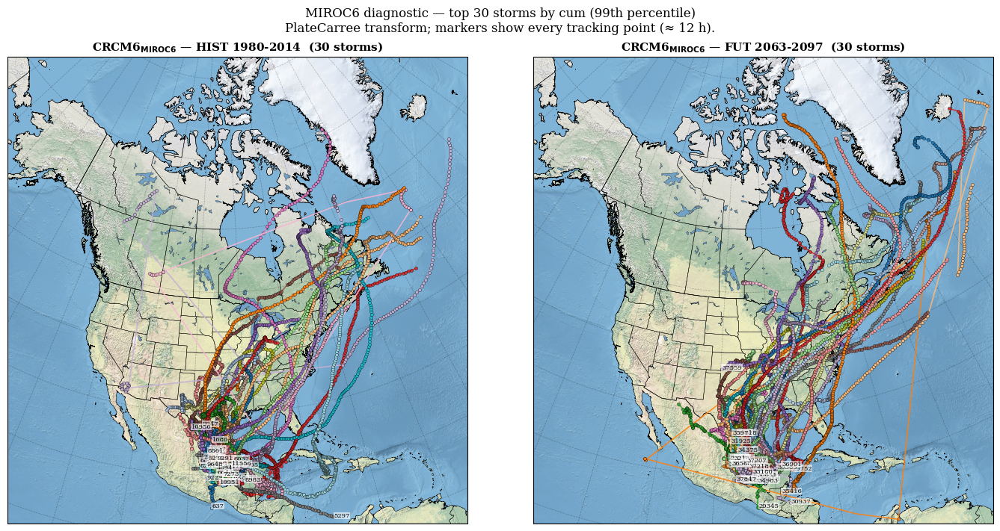

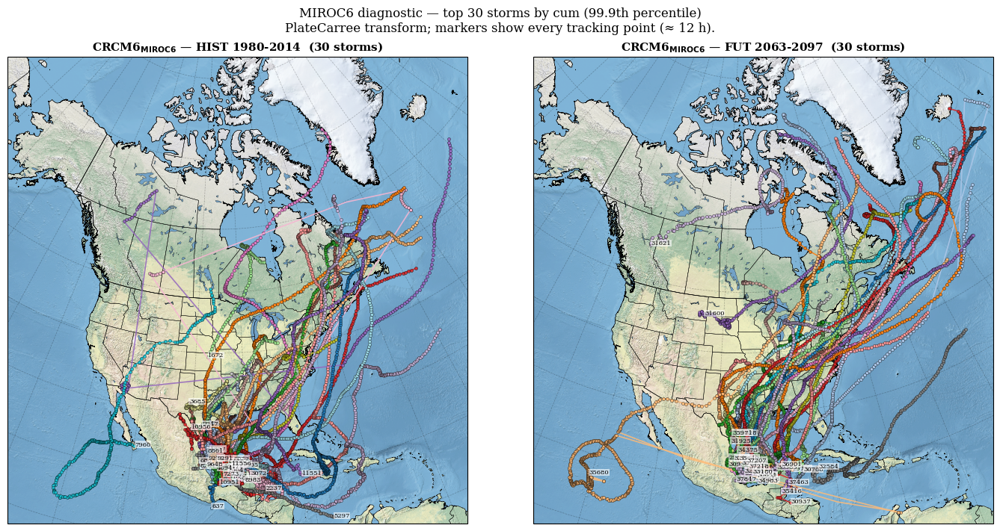

In [20]:
# --- Diagnostic cell ---
# Verify MIROC6 trajectories (last column): plot all top-N storms (HIST + FUT)
# of MIROC6 with explicit point markers and one color per storm, so individual
# tracking points can be inspected manually. Uses ccrs.PlateCarree() transform
# (raw lon/lat) so any oddity in the line geometry reflects the data, not a
# Geodetic-projection artifact.

def plot_miroc6_trajectory_points(metric_var='pr', select_by='cum', pct=PERCENTILES[0],
                                    lambda_=LAMBDA, top_storms=N_TOP):
    miroc_pair = pairs[-1]  # MIROC6 is the right-most column
    hist, fut = miroc_pair
    plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)
    fig, axes = plt.subplots(1, 2, subplot_kw={'projection': plotcrs},
                              figsize=(14, 7), constrained_layout=True)

    borders = cartopy.feature.NaturalEarthFeature(
        category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
    states_provinces = cartopy.feature.NaturalEarthFeature(
        category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
    lakes = cartopy.feature.NaturalEarthFeature(
        category='physical', name='lakes', scale='50m', facecolor='#72a2c7')
    img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')

    cmap = plt.get_cmap('tab20')

    for ax, (sim, period_lbl) in zip(axes, [(hist, 'HIST 1980-2014'), (fut, 'FUT 2063-2097')]):
        ax.set_extent([-128, -56, 81, 12], crs=ccrs.PlateCarree())
        ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90),
                  transform=ccrs.PlateCarree())
        ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
        ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
        ax.add_feature(lakes, zorder=1, linewidth=0.2, edgecolor='black')
        ax.coastlines(resolution='10m', linewidth=0.4, color='black')
        ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25,
                     xlocs=range(-180, 180, 10), ylocs=range(-90, 90, 10))

        df = data_pct[pct][sim]
        if select_by == 'intensity':
            df = add_regularized_intensity(df, metric_var, lambda_)
            sel_col = f'ireg_{metric_var}_lam{lambda_}'
        else:
            sel_col = f'cum_excess_{metric_var}'
        top = df.nlargest(top_storms, sel_col)
        top_ids = top['storm_id'].tolist()

        tracks = load_tracks(sim)
        tr = tracks[tracks['storm'].isin(top_ids)].sort_values(['storm', 'point'])
        for k, (sid, g) in enumerate(tr.groupby('storm')):
            color = cmap(k % 20)
            ax.plot(g['lon'].values, g['lat'].values,
                     color=color, lw=1.2, alpha=0.85,
                     marker='o', markersize=3,
                     markeredgecolor='black', markeredgewidth=0.3,
                     transform=ccrs.Geodetic(), zorder=3)
            # Storm-id label at first point for manual cross-reference
            ax.text(g['lon'].iloc[0], g['lat'].iloc[0], str(int(sid)),
                     color='black', fontsize=6, zorder=6,
                     transform=ccrs.PlateCarree(),
                     bbox=dict(facecolor='white', alpha=0.6, pad=0.5,
                               edgecolor='none'))

        ax.set_title(f'{sim_label[sim]} — {period_lbl}  ({len(top_ids)} storms)',
                     fontsize=11, fontweight='bold')

    fig.suptitle(
        f'MIROC6 diagnostic — top {top_storms} storms by {select_by} '
        f'({PCT_LABEL[pct]} percentile)\n'
        f'PlateCarree transform; markers show every tracking point (≈ 12 h).',
        fontsize=12)
    return fig


fig_check_p99   = plot_miroc6_trajectory_points(pct=99)
fig_check_p999  = plot_miroc6_trajectory_points(pct=999)
plt.show()


### Wind

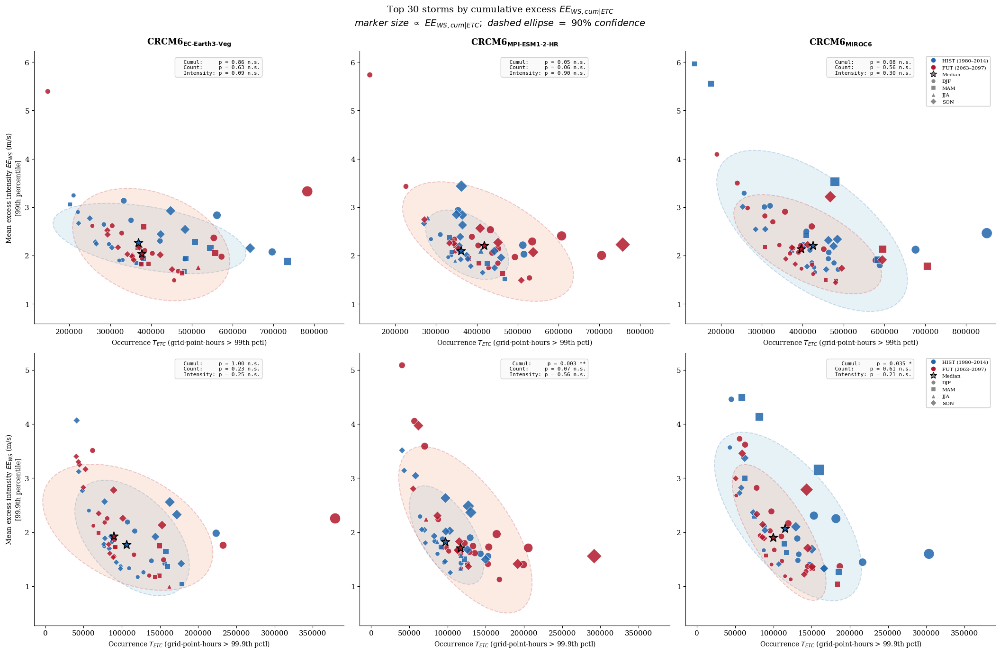

In [5]:
fig = plot_top_scatter('wind', 'm/s', select_by='cum', variable_marker_size=True)
plt.show()
# fig.savefig(f'{base}/TRACKING/KATJA/PLOT/scatter_top{N_TOP}_storms_cumul_wind_land.png', dpi=200, bbox_inches='tight')

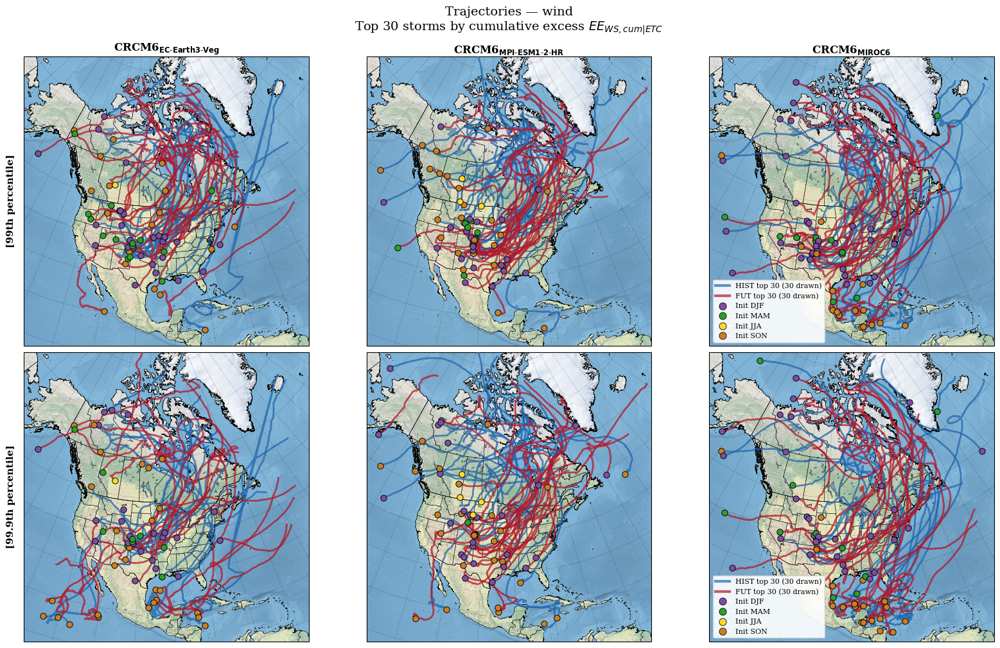

In [6]:
fig = plot_top_trajectories('wind', 'm/s', select_by='cum')
plt.show()
# fig.savefig(f'{base}/TRACKING/PLOT/tracks_top{N_TOP}_storms_cumul_wind.png', dpi=200, bbox_inches='tight')

## Selection by regularized mean excess intensity

The second set of figures selects the **top-N storms by regularized intensity**

$$I_{reg} = \overline{EE_V} \cdot \frac{T_{ETC}}{T_{ETC}+\lambda}, \qquad \lambda = 10\,000$$

The $\lambda$ factor down-weights storms whose high mean intensity is supported by
very few exceeding grid-point-hours (small $T_{ETC}$), while leaving storms with
large $T_{ETC}$ essentially untouched. This isolates the most *violent* storms per
grid-point-hour independently of their spatial/temporal extent — a different view
from the cumulative-excess selection above, which is biased towards long-lived /
widespread systems.

**The axes still show the raw $T_{ETC}$ and $\overline{EE_V}$** (not the regularized
metric), and marker size still scales with cumulative excess, so the two
selections can be compared panel-by-panel.

### Precipitation

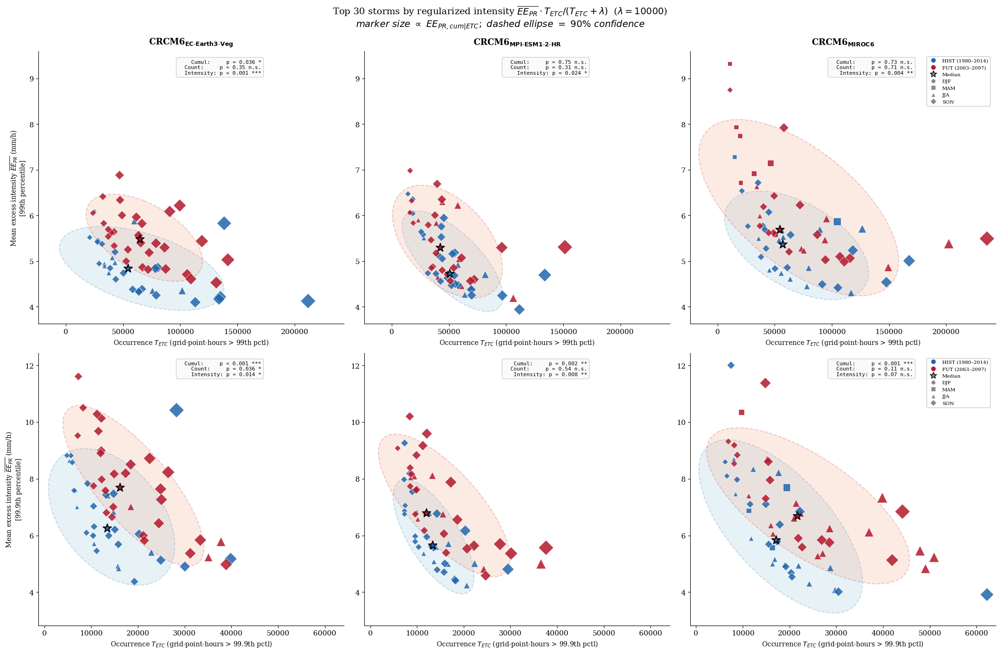

In [7]:
fig = plot_top_scatter('pr', 'mm/h', select_by='intensity', variable_marker_size=True, lambda_=10000)
plt.show()
# fig.savefig(f'{base}/TRACKING/KATJA/PLOT/scatter_top{N_TOP}_storms_intensity_lambda10000_precip_land.png', dpi=200, bbox_inches='tight')

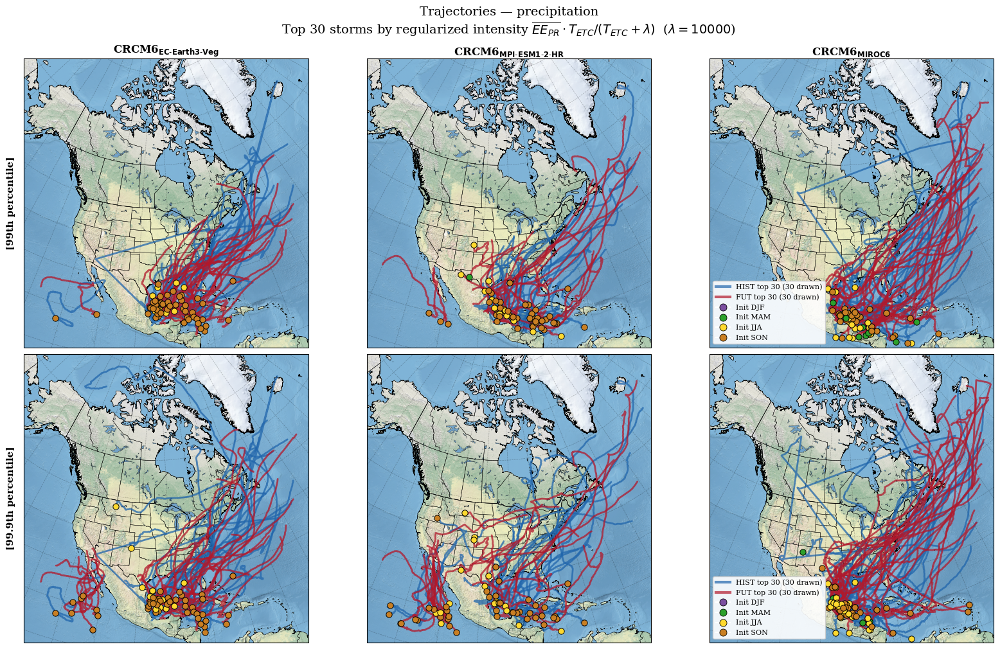

In [8]:
fig = plot_top_trajectories('pr', 'mm/h', select_by='intensity')
plt.show()
# fig.savefig(f'{base}/TRACKING/PLOT/tracks_top{N_TOP}_storms_intensity_precip.png', dpi=200, bbox_inches='tight')

### Wind

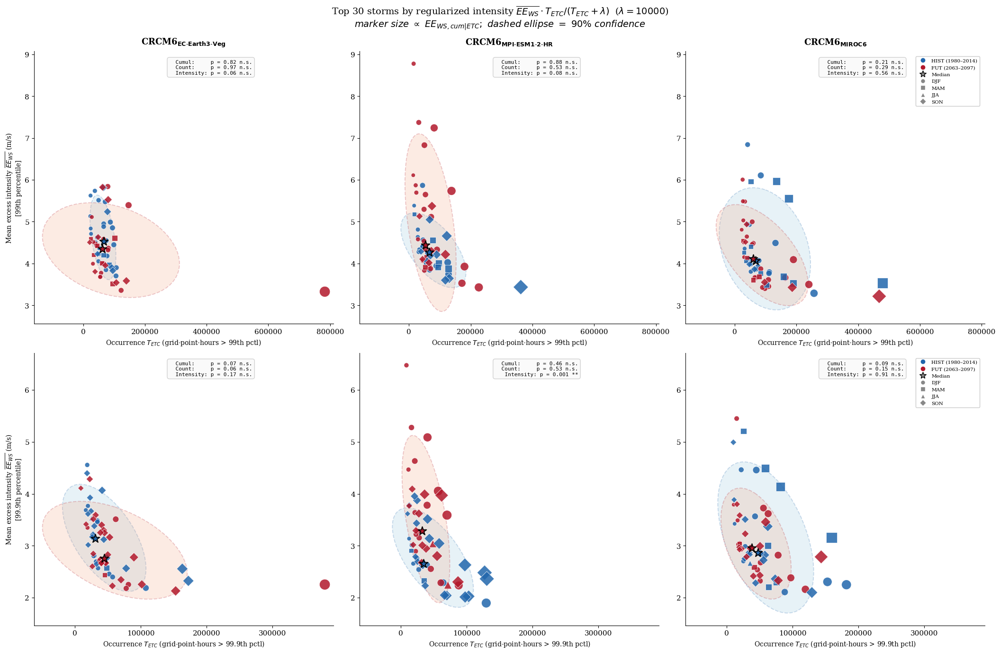

In [9]:
fig = plot_top_scatter('wind', 'm/s', select_by='intensity', variable_marker_size=True, lambda_=10000)
plt.show()
# fig.savefig(f'{base}/TRACKING/KATJA/PLOT/scatter_top{N_TOP}_storms_intensity_lambda10000_wind_land.png', dpi=200, bbox_inches='tight')

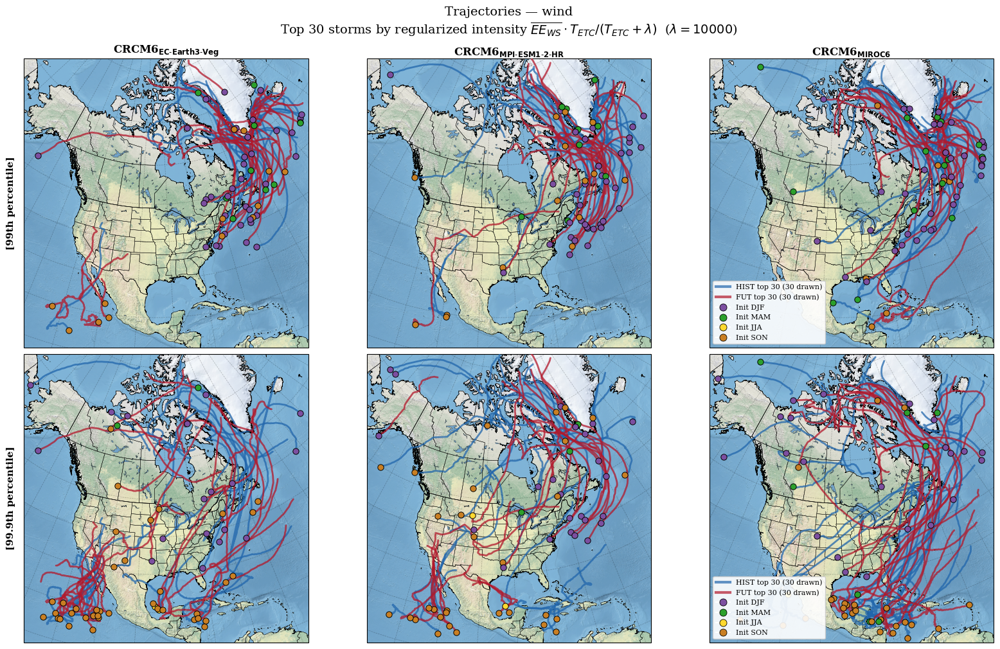

In [10]:
fig = plot_top_trajectories('wind', 'm/s', select_by='intensity')
plt.show()
# fig.savefig(f'{base}/TRACKING/PLOT/tracks_top{N_TOP}_storms_intensity_wind.png', dpi=200, bbox_inches='tight')

## Top-N storms ranked by mean excess intensity

A third view: after selecting the top-N storms by regularized intensity, we sort
them by their raw mean excess $\overline{EE_V}$ and plot intensity vs rank
(1 = most intense). The HIST and FUT curves make the **upper-tail shift** visible
directly: where the FUT curve lies above HIST (shaded red), future extremes are
stronger at that rank; the opposite is shaded blue. A clear gap at the top ranks
(left-hand side) is the climate-change signal on the most violent storms.

Marker shape still encodes initiation season, and the per-panel stats box reports
the Mann-Whitney U test on the intensity distribution of the top-N storms, plus
the median change (%) between HIST and FUT.

### Precipitation

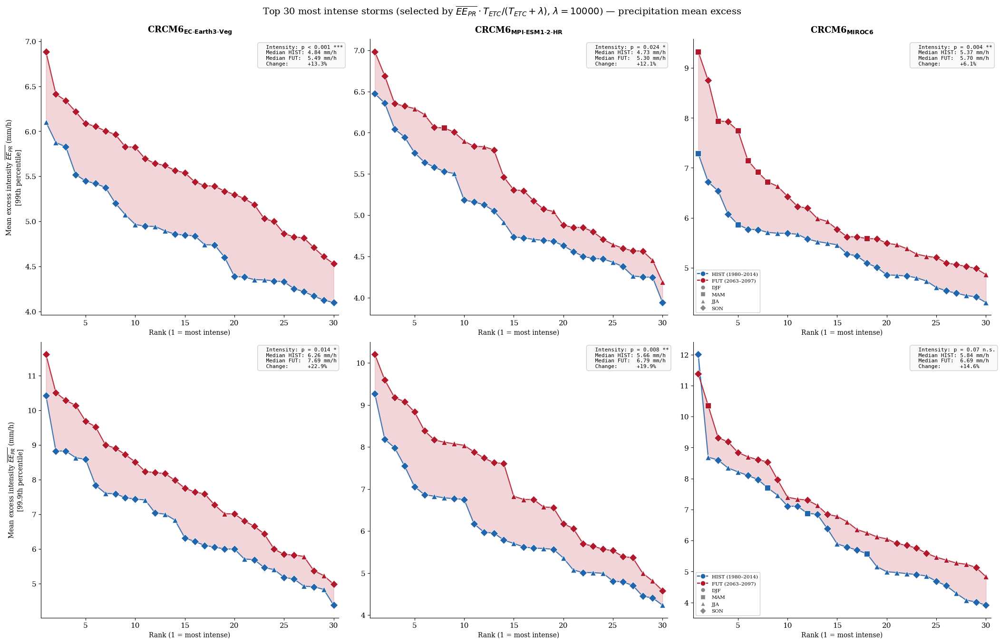

In [11]:
def plot_top_intensity_ranks(metric_var, units, lambda_=LAMBDA, top_storms=N_TOP):
    """Sorted intensity vs rank for the top-N storms selected by regularized intensity
    I_reg = mean_excess * n / (n + lam). 2 rows (99th, 99.9th) x 3 cols (pairs).

    Parameters
    ----------
    metric_var : {'pr', 'wind'}
    units : str
        Units of mean excess intensity, shown on the y-axis.
    lambda_ : float
        Regularization strength for the selection metric I_reg.
    top_storms : int
        Number of storms kept per (simulation, percentile) panel.

    The legend is drawn only in the right-most column of each row (one legend per
    percentile) to avoid repeating it six times across the figure.
    """
    int_col = f'mean_excess_{metric_var}'
    ireg_col = f'ireg_{metric_var}_lam{lambda_}'

    fig, axes = plt.subplots(2, 3, figsize=(21, 13), constrained_layout=True)

    for row, pct in enumerate(PERCENTILES):
        for col, (hist, fut) in enumerate(pairs):
            ax = axes[row, col]

            df_h_all = add_regularized_intensity(data_pct[pct][hist], metric_var, lambda_)
            df_f_all = add_regularized_intensity(data_pct[pct][fut], metric_var, lambda_)

            df_hist = df_h_all.nlargest(top_storms, ireg_col).sort_values(int_col, ascending=False).reset_index(drop=True)
            df_fut = df_f_all.nlargest(top_storms, ireg_col).sort_values(int_col, ascending=False).reset_index(drop=True)

            n = min(len(df_hist), len(df_fut))
            df_hist = df_hist.iloc[:n]
            df_fut = df_fut.iloc[:n]
            ranks = np.arange(1, n + 1)

            ax.fill_between(ranks, df_hist[int_col], df_fut[int_col],
                             where=(df_fut[int_col].values >= df_hist[int_col].values),
                             interpolate=True, color=C_FUT, alpha=0.18, label='FUT > HIST')
            ax.fill_between(ranks, df_hist[int_col], df_fut[int_col],
                             where=(df_fut[int_col].values < df_hist[int_col].values),
                             interpolate=True, color=C_HIST, alpha=0.18, label='HIST > FUT')

            ax.plot(ranks, df_hist[int_col], color=C_HIST, linewidth=1.6, alpha=0.85, zorder=3)
            ax.plot(ranks, df_fut[int_col], color=C_FUT, linewidth=1.6, alpha=0.85, zorder=3)

            for season, marker in SEASON_MARKER.items():
                mh = df_hist['season'].values == season
                mf = df_fut['season'].values == season
                if mh.any():
                    ax.scatter(ranks[mh], df_hist[int_col].values[mh], marker=marker,
                               color=C_HIST, edgecolors='white', linewidths=0.6, s=70, zorder=4)
                if mf.any():
                    ax.scatter(ranks[mf], df_fut[int_col].values[mf], marker=marker,
                               color=C_FUT, edgecolors='white', linewidths=0.6, s=70, zorder=4)

            _, p_int = stats.mannwhitneyu(df_hist[int_col], df_fut[int_col], alternative='two-sided')
            med_h = df_hist[int_col].median()
            med_f = df_fut[int_col].median()
            change = (med_f - med_h) / med_h * 100 if med_h != 0 else np.nan

            textstr = (f'  Intensity: {format_pval(p_int)} {significance_stars(p_int)}\n'
                       f'  Median HIST: {med_h:.2f} {units}\n'
                       f'  Median FUT:  {med_f:.2f} {units}\n'
                       f'  Change:      {change:+.1f}%')
            ax.text(0.735, 0.98, textstr, transform=ax.transAxes, fontsize=8,
                    verticalalignment='top', fontfamily='monospace',
                    bbox=dict(boxstyle='round,pad=0.4', facecolor='#fafafa',
                              edgecolor='#cccccc', alpha=0.9))

            ax.set_xlabel('Rank (1 = most intense)', fontsize=10)
            if col == 0:
                var_math = 'PR' if metric_var == 'pr' else 'WS'
                ax.set_ylabel(rf'Mean excess intensity $\overline{{EE_{{{var_math}}}}}$ ({units})' + '\n'
                              f'[{PCT_LABEL[pct]} percentile]', fontsize=10)
            if row == 0:
                ax.set_title(sim_label[hist], fontsize=13, fontweight='bold', pad=10)
            ax.set_xlim(0.5, top_storms + 0.5)

            # Legend only in the right-most column (one per row / percentile)
            if col == len(pairs) - 1:
                legend_handles = [
                    Line2D([0], [0], marker='o', color=C_HIST, markerfacecolor=C_HIST,
                           markeredgecolor='white', markersize=8, linewidth=1.6, label='HIST (1980\u20132014)'),
                    Line2D([0], [0], marker='o', color=C_FUT, markerfacecolor=C_FUT,
                           markeredgecolor='white', markersize=8, linewidth=1.6, label='FUT (2063\u20132097)'),
                ]
                for season, marker in SEASON_MARKER.items():
                    legend_handles.append(
                        Line2D([0], [0], marker=marker, color='w', markerfacecolor='#888',
                               markeredgecolor='white', markersize=7, label=season)
                    )
                ax.legend(handles=legend_handles, fontsize=7.5, loc='lower left',
                          framealpha=0.9, edgecolor='#cccccc')

    var_math = 'PR' if metric_var == 'pr' else 'WS'
    fig.suptitle(rf'Top {top_storms} most intense storms (selected by '
                 rf'$\overline{{EE_{{{var_math}}}}} \cdot T_{{ETC}}/(T_{{ETC}}+\lambda)$, '
                 rf'$\lambda = {lambda_}$) — '
                 f'{("precipitation" if metric_var=="pr" else "wind")} mean excess',
                 fontsize=14, y=1.03)
    return fig


fig = plot_top_intensity_ranks('pr', 'mm/h', lambda_=10000)
plt.show()
# # fig.savefig(f'{base}/TRACKING/KATJA/PLOT/rank_top{N_TOP}_intensity_precip.png', dpi=200, bbox_inches='tight')

### Wind

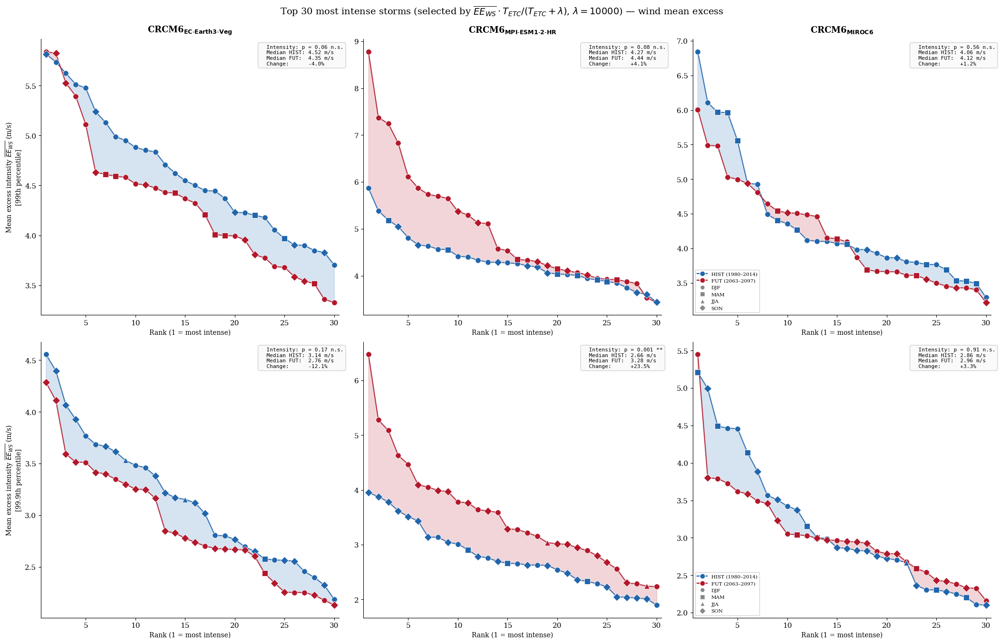

In [12]:
fig = plot_top_intensity_ranks('wind', 'm/s', lambda_=10000)
plt.show()
# # fig.savefig(f'{base}/TRACKING/KATJA/PLOT/rank_top{N_TOP}_intensity_wind.png', dpi=200, bbox_inches='tight')

## Summary: statistical tests on the full storm population (99.9th percentile)

Unlike the figures above, which restrict attention to the top-N most extreme storms,
this table summarises the HIST-vs-FUT distributional differences across **all storms
with non-zero exceedance** for each GCM pair and each metric. Two complementary tests
are reported:

- **Mann-Whitney U** (MW-U): non-parametric test of whether one distribution is
  stochastically greater than the other. Makes no normality assumption.
- **Kolmogorov-Smirnov** (KS): tests whether two samples come from the same
  continuous distribution (sensitive to both location and shape shifts).

For each row, we also report the median in HIST and FUT, and the median change (%),
to make the *direction* and *magnitude* of the shift readable at a glance. Significance
levels: `***` p<0.001, `**` p<0.01, `*` p<0.05, `n.s.` not significant.

In [13]:
metrics_all = [
    ('cum_excess_pr', 'Precip cumul'),
    ('count_exceed_pr', 'Precip count'),
    ('mean_excess_pr', 'Precip intensity'),
    ('cum_excess_wind', 'Wind cumul'),
    ('count_exceed_wind', 'Wind count'),
    ('mean_excess_wind', 'Wind intensity'),
]

rows = []
for hist, fut in pairs:
    for metric, label in metrics_all:
        var = 'pr' if 'pr' in metric else 'wind'
        cum_col = f'cum_excess_{var}'

        h = data[hist].dropna(subset=[metric])
        f = data[fut].dropna(subset=[metric])
        h = h[h[cum_col] > 0][metric]
        f = f[f[cum_col] > 0][metric]

        mw_stat, mw_p = stats.mannwhitneyu(h, f, alternative='two-sided')
        ks_stat, ks_p = stats.ks_2samp(h, f)

        rows.append({
            'GCM': sim_name[hist],
            'Metric': label,
            'Median hist': f'{h.median():.2f}',
            'Median fut': f'{f.median():.2f}',
            'Change (%)': f'{((f.median() - h.median()) / h.median()) * 100:+.1f}' if h.median() != 0 else 'N/A',
            'MW-U p': format_pval(mw_p),
            'MW-U': significance_stars(mw_p),
            'KS p': format_pval(ks_p),
            'KS': significance_stars(ks_p),
            'N hist': len(h),
            'N fut': len(f),
        })

df_stats = pd.DataFrame(rows)
df_stats

,GCM,Metric,Median hist,Median fut,Change (%),MW-U p,MW-U,KS p,KS,N hist,N fut
0,CRCM6 (EC-Earth3-Veg),Precip cumul,627.51,1336.62,+113.0,p < 0.001,***,p < 0.001,***,9025,8739
1,CRCM6 (EC-Earth3-Veg),Precip count,596.00,1130.00,+89.6,p < 0.001,***,p < 0.001,***,9025,8739
2,CRCM6 (EC-Earth3-Veg),Precip intensity,1.02,1.12,+10.2,p < 0.001,***,p < 0.001,***,9025,8739
3,CRCM6 (EC-Earth3-Veg),Wind cumul,250.89,215.29,-14.2,p = 0.16,n.s.,p = 0.10,n.s.,7825,7314
4,CRCM6 (EC-Earth3-Veg),Wind count,385.00,352.00,-8.6,p = 0.57,n.s.,p = 0.46,n.s.,7825,7314
5,CRCM6 (EC-Earth3-Veg),Wind intensity,0.66,0.65,-2.5,p < 0.001,***,p < 0.001,***,7825,7314
6,CRCM6 (MPI-ESM1-2-HR),Precip cumul,519.32,887.34,+70.9,p < 0.001,***,p < 0.001,***,8761,8823
7,CRCM6 (MPI-ESM1-2-HR),Precip count,528.00,849.00,+60.8,p < 0.001,***,p < 0.001,***,8761,8823
8,CRCM6 (MPI-ESM1-2-HR),Precip intensity,0.95,1.01,+5.7,p < 0.001,***,p < 0.001,***,8761,8823
9,CRCM6 (MPI-ESM1-2-HR),Wind cumul,255.86,223.36,-12.7,p = 0.19,n.s.,p = 0.038,*,7700,7526
